In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from glob import glob
from PIL import Image

In [2]:
df=pd.read_csv('E:\Code_playground\Skin Cancer\data\HAM10000\HAM10000_metadata.csv')

In [3]:
df.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization,dataset
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,vidir_modern
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,vidir_modern
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,vidir_modern
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,vidir_modern
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,vidir_modern


In [4]:
df.shape

(10015, 8)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10015 entries, 0 to 10014
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   lesion_id     10015 non-null  object 
 1   image_id      10015 non-null  object 
 2   dx            10015 non-null  object 
 3   dx_type       10015 non-null  object 
 4   age           9958 non-null   float64
 5   sex           10015 non-null  object 
 6   localization  10015 non-null  object 
 7   dataset       10015 non-null  object 
dtypes: float64(1), object(7)
memory usage: 626.1+ KB


In [6]:
df.describe

<bound method NDFrame.describe of          lesion_id      image_id     dx dx_type   age     sex localization  \
0      HAM_0000118  ISIC_0027419    bkl   histo  80.0    male        scalp   
1      HAM_0000118  ISIC_0025030    bkl   histo  80.0    male        scalp   
2      HAM_0002730  ISIC_0026769    bkl   histo  80.0    male        scalp   
3      HAM_0002730  ISIC_0025661    bkl   histo  80.0    male        scalp   
4      HAM_0001466  ISIC_0031633    bkl   histo  75.0    male          ear   
...            ...           ...    ...     ...   ...     ...          ...   
10010  HAM_0002867  ISIC_0033084  akiec   histo  40.0    male      abdomen   
10011  HAM_0002867  ISIC_0033550  akiec   histo  40.0    male      abdomen   
10012  HAM_0002867  ISIC_0033536  akiec   histo  40.0    male      abdomen   
10013  HAM_0000239  ISIC_0032854  akiec   histo  80.0    male         face   
10014  HAM_0003521  ISIC_0032258    mel   histo  70.0  female         back   

            dataset  
0      

In [7]:
df.describe()

,age
count,9958.000000
mean,51.863828
std,16.968614
min,0.000000
25%,40.000000
50%,50.000000
75%,65.000000
max,85.000000


In [6]:
#Read Images with their respective IDs
image_path = {os.path.splitext(os.path.basename(x))[0]: x
                     for x in glob(os.path.join('data/HAM10000/', '*', '*.jpg'))}

In [7]:
#Define the path and add as a new column
df['path'] = df['image_id'].map(image_path.get)

In [8]:
df['path']

0        data/HAM10000\HAM10000_images_part_1\ISIC_0027...
1        data/HAM10000\HAM10000_images_part_1\ISIC_0025...
2        data/HAM10000\HAM10000_images_part_1\ISIC_0026...
3        data/HAM10000\HAM10000_images_part_1\ISIC_0025...
4        data/HAM10000\HAM10000_images_part_2\ISIC_0031...
                               ...                        
10010    data/HAM10000\HAM10000_images_part_2\ISIC_0033...
10011    data/HAM10000\HAM10000_images_part_2\ISIC_0033...
10012    data/HAM10000\HAM10000_images_part_2\ISIC_0033...
10013    data/HAM10000\HAM10000_images_part_2\ISIC_0032...
10014    data/HAM10000\HAM10000_images_part_2\ISIC_0032...
Name: path, Length: 10015, dtype: object

In [9]:
#Using the path to read images
df['image'] = df['path'].map(lambda x: np.asarray(Image.open(x).resize((64,64))))

In [10]:
print(df['dx'].value_counts())

nv       6705
mel      1113
bkl      1099
bcc       514
akiec     327
vasc      142
df        115
Name: dx, dtype: int64


Melanocytic nevi(nv) </br>
Melanoma(mel)</br>
Benign Keratosis-like lesions(bkl)</br>
Basal cell carcinoma(bcc)</br>
Actinic keratoses(akiec)</br>
Vascular lesions(vas)</br>
Dermatofibroma(df)</br>

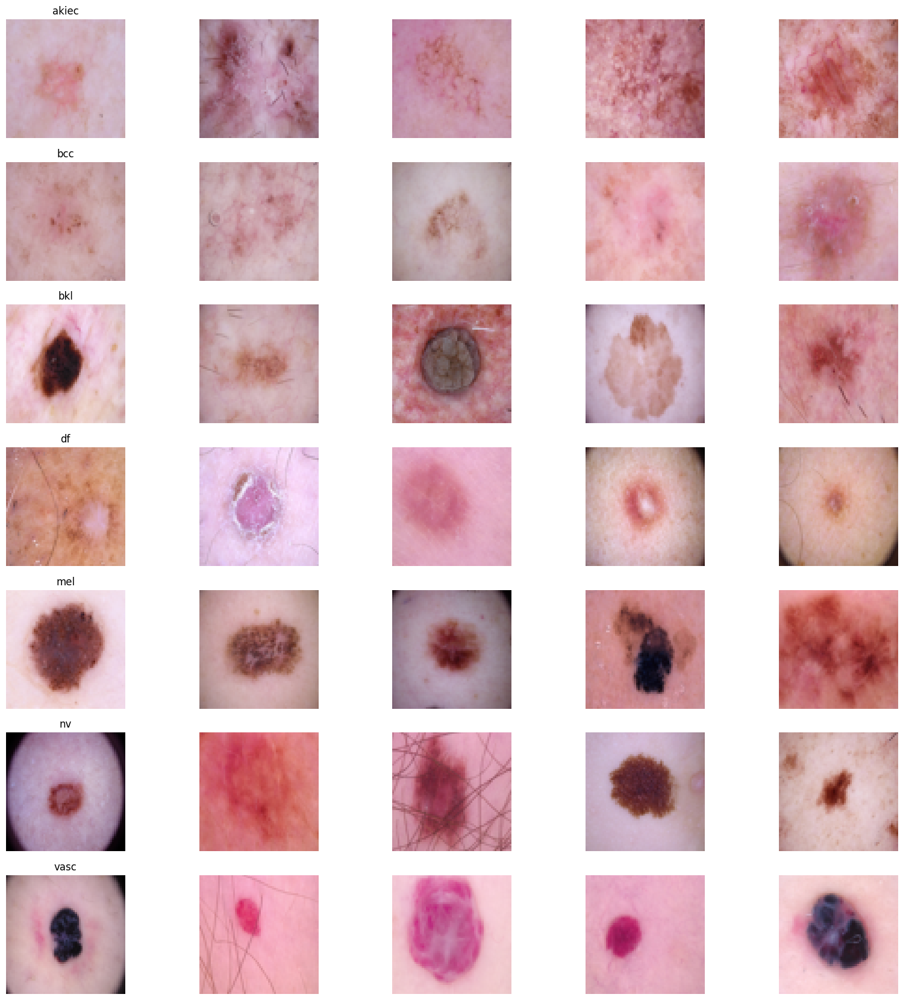

In [11]:
n_samples = 5  # number of samples for plotting
# Plotting
fig, m_axs = plt.subplots(7, n_samples, figsize = (4*n_samples, 3*7))
for n_axs, (type_name, type_rows) in zip(m_axs, 
                                         df.sort_values(['dx']).groupby('dx')):
    n_axs[0].set_title(type_name)
    for c_ax, (_, c_row) in zip(n_axs, type_rows.sample(n_samples, random_state=1234).iterrows()):
        c_ax.imshow(c_row['image'])
        c_ax.axis('off')

In [12]:
import seaborn as sns
np.random.seed(42)
from tensorflow.keras.utils import to_categorical  # used for converting labels to one-hot-encoding
from sklearn.model_selection import train_test_split
from scipy import stats
from sklearn.preprocessing import LabelEncoder
import autokeras as ak

Using TensorFlow backend


In [13]:
SIZE=64

# label encoding to numeric values from text
le = LabelEncoder()
le.fit(df['dx'])
LabelEncoder()
print(list(le.classes_))

['akiec', 'bcc', 'bkl', 'df', 'mel', 'nv', 'vasc']


In [14]:
label_mapping = {
    0: 'nv',
    1: 'mel',
    2: 'bkl',
    3: 'bcc',
    4: 'akiec',
    5: 'vasc',
    6: 'df'
}

In [15]:
lesion_type_dict = {
    'nv': 'Melanocytic nevi (nv)',
    'mel': 'Melanoma (mel)',
    'bkl': 'Benign keratosis-like lesions (bkl)',
    'bcc': 'Basal cell carcinoma (bcc)',
    'akiec': 'Actinic keratoses (akiec)',
    'vasc': 'Vascular lesions (vasc)',
    'df': 'Dermatofibroma (df)'
}

In [16]:
df.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization,dataset,path,image
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,vidir_modern,data/HAM10000\HAM10000_images_part_1\ISIC_0027...,"[[[191, 152, 194], [191, 153, 195], [192, 149,..."
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,vidir_modern,data/HAM10000\HAM10000_images_part_1\ISIC_0025...,"[[[23, 13, 23], [25, 14, 28], [37, 24, 46], [6..."
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,vidir_modern,data/HAM10000\HAM10000_images_part_1\ISIC_0026...,"[[[186, 129, 140], [192, 136, 151], [198, 143,..."
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,vidir_modern,data/HAM10000\HAM10000_images_part_1\ISIC_0025...,"[[[24, 11, 19], [36, 20, 30], [64, 38, 50], [9..."
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,vidir_modern,data/HAM10000\HAM10000_images_part_2\ISIC_0031...,"[[[139, 95, 118], [158, 114, 138], [178, 133, ..."


In [17]:
df['label'] = le.transform(df["dx"]) 
print(df.sample(10))

        lesion_id      image_id   dx    dx_type   age     sex  \
1617  HAM_0007180  ISIC_0033272  mel      histo  65.0    male   
8128  HAM_0007195  ISIC_0031923   nv      histo  40.0  female   
2168  HAM_0001835  ISIC_0026652  mel      histo  65.0    male   
1090  HAM_0000465  ISIC_0030583  bkl  consensus  35.0  female   
7754  HAM_0001720  ISIC_0034010   nv      histo  45.0    male   
8071  HAM_0006333  ISIC_0024424   nv      histo  35.0    male   
7423  HAM_0004548  ISIC_0032832   nv      histo  45.0  female   
8984  HAM_0006526  ISIC_0026671   nv      histo  55.0    male   
2310  HAM_0003102  ISIC_0032389  mel      histo  65.0    male   
7256  HAM_0004260  ISIC_0025525   nv      histo  65.0    male   

         localization        dataset  \
1617             face   vidir_modern   
8128  lower extremity    vienna_dias   
2168             back      rosendahl   
1090            trunk  vidir_molemax   
7754          abdomen   vidir_modern   
8071            trunk    vienna_dias   
7423

#### Data distribution visualization

C:\Users\abhis\AppData\Local\Temp\ipykernel_19064\1452318004.py:21: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(sample_age['age'], fit=stats.norm, color='red');


Text(0.5, 1.0, 'Age')

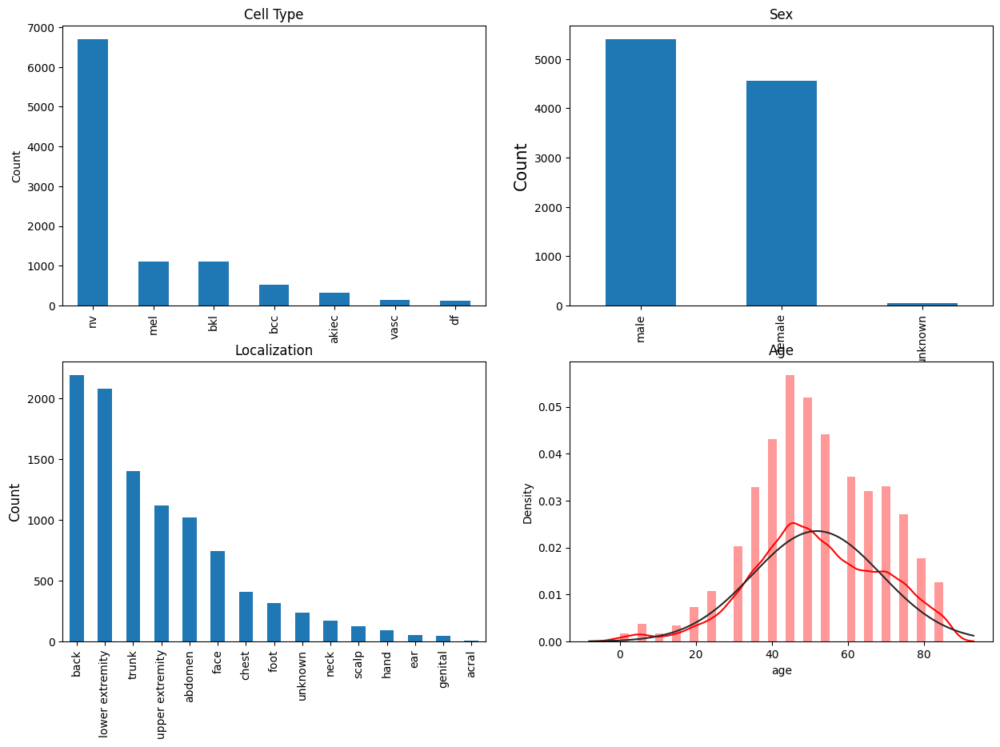

In [18]:
fig = plt.figure(figsize=(15,10))

ax1 = fig.add_subplot(221)
df['dx'].value_counts().plot(kind='bar', ax=ax1)
ax1.set_ylabel('Count')
ax1.set_title('Cell Type');

ax2 = fig.add_subplot(222)
df['sex'].value_counts().plot(kind='bar', ax=ax2)
ax2.set_ylabel('Count', size=15)
ax2.set_title('Sex');

ax3 = fig.add_subplot(223)
df['localization'].value_counts().plot(kind='bar')
ax3.set_ylabel('Count',size=12)
ax3.set_title('Localization')


ax4 = fig.add_subplot(224)
sample_age = df[pd.notnull(df['age'])]
sns.distplot(sample_age['age'], fit=stats.norm, color='red');
ax4.set_title('Age')

In [19]:
# Distribution of data into various classes 
from sklearn.utils import resample
print(df['label'].value_counts())

5    6705
4    1113
2    1099
1     514
0     327
6     142
3     115
Name: label, dtype: int64


In [20]:
#Balance data.
# Many ways to balance data... you can also try assigning weights during model.fit
#Separate each classes, resample, and combine back into single dataframe

df_0 = df[df['label'] == 0]
df_1 = df[df['label'] == 1]
df_2 = df[df['label'] == 2]
df_3 = df[df['label'] == 3]
df_4 = df[df['label'] == 4]
df_5 = df[df['label'] == 5]
df_6 = df[df['label'] == 6]

In [21]:
df_0.shape

(327, 11)

In [22]:
n_samples=500 
df_0_balanced = resample(df_0, replace=True, n_samples=n_samples, random_state=42) 
df_1_balanced = resample(df_1, replace=True, n_samples=n_samples, random_state=42) 
df_2_balanced = resample(df_2, replace=True, n_samples=n_samples, random_state=42)
df_3_balanced = resample(df_3, replace=True, n_samples=n_samples, random_state=42)
df_4_balanced = resample(df_4, replace=True, n_samples=n_samples, random_state=42)
df_5_balanced = resample(df_5, replace=True, n_samples=n_samples, random_state=42)
df_6_balanced = resample(df_6, replace=True, n_samples=n_samples, random_state=42)

In [23]:
skin_df_balanced = pd.concat([df_0_balanced, df_1_balanced, 
                              df_2_balanced, df_3_balanced, 
                              df_4_balanced, df_5_balanced, df_6_balanced])

In [24]:
print(skin_df_balanced['label'].value_counts())

0    500
1    500
2    500
3    500
4    500
5    500
6    500
Name: label, dtype: int64


In [25]:
#Define the path and add as a new column
skin_df_balanced['path'] = df['image_id'].map(image_path.get)

In [26]:
skin_df_balanced['image'] = skin_df_balanced['path'].map(lambda x: np.asarray(Image.open(x).resize((64,64))))

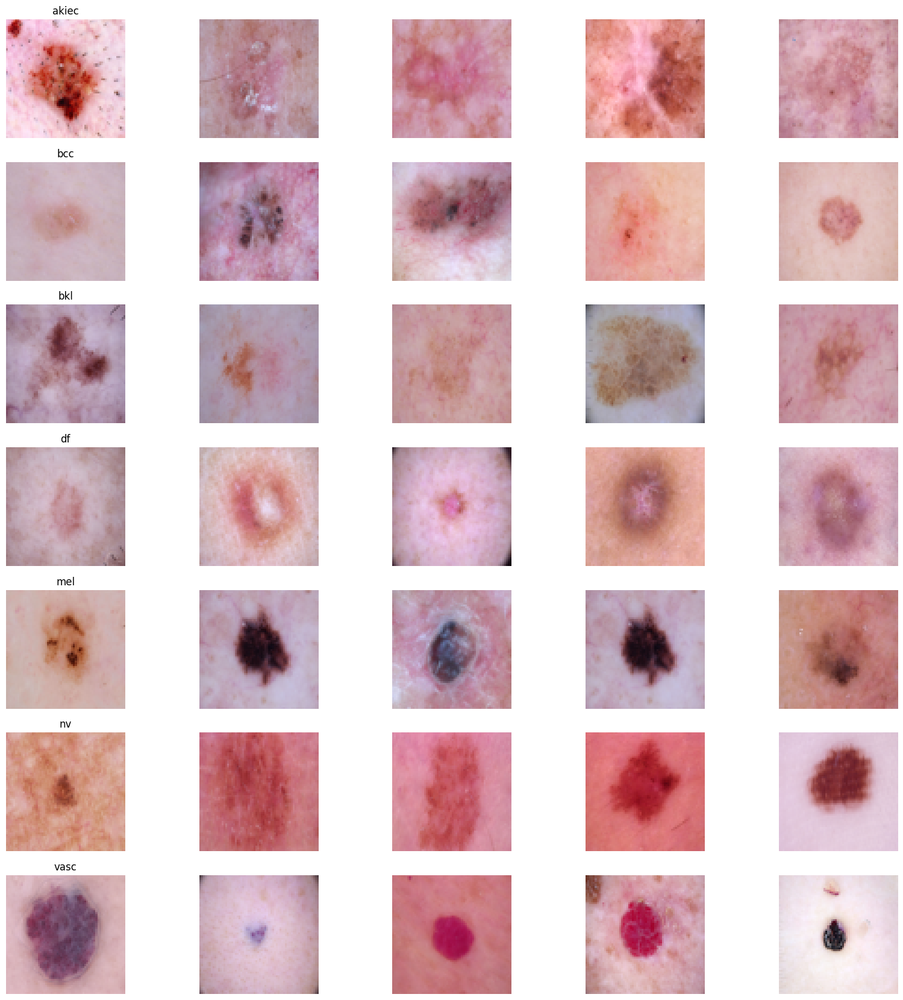

In [27]:
n_samples = 5  

# Plot
fig, m_axs = plt.subplots(7, n_samples, figsize = (4*n_samples, 3*7))
for n_axs, (type_name, type_rows) in zip(m_axs, 
                                         skin_df_balanced.sort_values(['dx']).groupby('dx')):
    n_axs[0].set_title(type_name)
    for c_ax, (_, c_row) in zip(n_axs, type_rows.sample(n_samples, random_state=1234).iterrows()):
        c_ax.imshow(c_row['image'])
        c_ax.axis('off')

In [28]:
#Convert dataframe column of images into numpy array
X = np.asarray(skin_df_balanced['image'].tolist())
X = X/255. # Scale values to 0-1. You can also used standardscaler or other scaling methods.
Y=skin_df_balanced['label'] #Assign label values to Y
Y_cat = to_categorical(Y, num_classes=7) #Convert to categorical as this is a multiclass classification problem

In [29]:
#Convert dataframe column of images into numpy array
X = np.asarray(skin_df_balanced['image'].tolist())
X = X/255.  # Scale values to 0-1. You can also used standardscaler or other scaling methods.
Y=skin_df_balanced['label']  #Assign label values to Y
Y_cat = to_categorical(Y, num_classes=7) #Convert to categorical as this is a multiclass classification problem
#Split to training and testing
x_train, x_test, y_train, y_test = train_test_split(X, Y_cat, test_size=0.25, random_state=42)

In [30]:
#Split to training and testing. Get a very small dataset for training as we will be 
# fitting it to many potential models. 
x_train_auto, x_test_auto, y_train_auto, y_test_auto = train_test_split(X, Y_cat, test_size=0.95, random_state=42)


In [31]:
#Further split data into smaller size to get a small test dataset. 
x_unused, x_valid, y_unused, y_valid = train_test_split(x_test_auto, y_test_auto, test_size=0.05, random_state=42)

In [32]:
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D, BatchNormalization
from sklearn.metrics import confusion_matrix

In [33]:
SIZE

64

In [34]:
num_classes = 7

model = Sequential()
model.add(Conv2D(256, (3, 3), activation="relu", input_shape=(SIZE, SIZE, 3)))

In [41]:
#model.add(BatchNormalization())
model.add(MaxPool2D(pool_size=(2, 2)))  
model.add(Dropout(0.3))

In [42]:
model.add(Conv2D(128, (3, 3),activation='relu'))
#model.add(BatchNormalization())
model.add(MaxPool2D(pool_size=(2, 2)))  
model.add(Dropout(0.3))

In [43]:
model.add(Conv2D(64, (3, 3),activation='relu'))
#model.add(BatchNormalization())
model.add(MaxPool2D(pool_size=(2, 2)))  
model.add(Dropout(0.3))
model.add(Flatten())

In [44]:
model.add(Dense(32))
model.add(Dense(7, activation='softmax'))
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 256)     7168      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 111, 111, 256)    0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 111, 111, 256)     0         
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 128)     295040    
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 54, 54, 128)      0         
 2D)                                                             
                                                                 
 dropout_1 (Dropout)         (None, 54, 54, 128)       0

In [67]:
model.compile(loss='categorical_crossentropy', optimizer='Adam', metrics=['acc'])

In [68]:
batch_size = 16 
epochs = 10

In [69]:
history = model.fit(
    x_train, y_train,
    epochs=epochs,
    batch_size = batch_size,
    validation_data=(x_test, y_test),
    verbose=2)



Epoch 1/10
165/165 - 60s - loss: 1.9262 - acc: 0.1848 - val_loss: 1.8329 - val_acc: 0.2411 - 60s/epoch - 362ms/step
Epoch 2/10
165/165 - 64s - loss: 1.7963 - acc: 0.2667 - val_loss: 1.7622 - val_acc: 0.2674 - 64s/epoch - 389ms/step
Epoch 3/10
165/165 - 66s - loss: 1.5930 - acc: 0.3539 - val_loss: 1.4992 - val_acc: 0.3611 - 66s/epoch - 397ms/step
Epoch 4/10
165/165 - 62s - loss: 1.4838 - acc: 0.4030 - val_loss: 1.4233 - val_acc: 0.4011 - 62s/epoch - 375ms/step
Epoch 5/10
165/165 - 65s - loss: 1.4192 - acc: 0.4320 - val_loss: 1.4217 - val_acc: 0.3977 - 65s/epoch - 396ms/step
Epoch 6/10
165/165 - 65s - loss: 1.3341 - acc: 0.4682 - val_loss: 1.3244 - val_acc: 0.4651 - 65s/epoch - 394ms/step
Epoch 7/10
165/165 - 65s - loss: 1.2874 - acc: 0.5048 - val_loss: 1.3251 - val_acc: 0.4789 - 65s/epoch - 391ms/step
Epoch 8/10
165/165 - 65s - loss: 1.2460 - acc: 0.5105 - val_loss: 1.2289 - val_acc: 0.5440 - 65s/epoch - 391ms/step
Epoch 9/10
165/165 - 69s - loss: 1.1724 - acc: 0.5516 - val_loss: 1.1728

In [70]:
score = model.evaluate(x_test, y_test)
print('Test accuracy:', score[1])

28/28 [==============================] - 4s 146ms/step - loss: 1.4552 - acc: 0.4320
Test accuracy: 0.4320000112056732


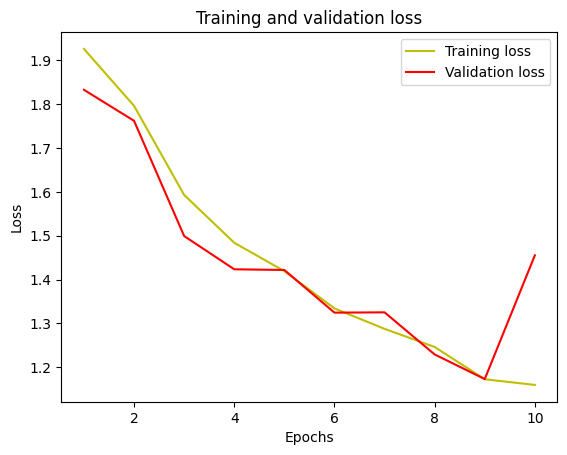

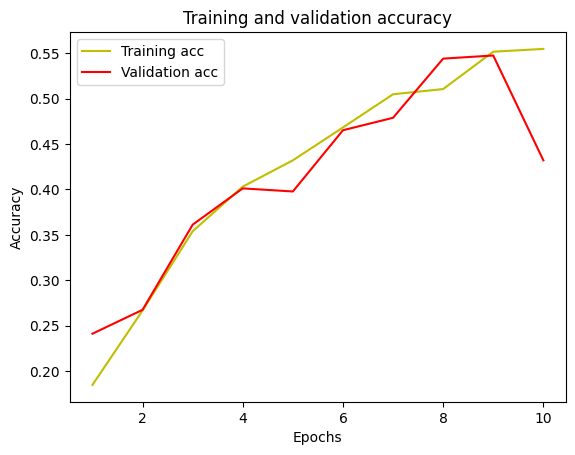

In [71]:
#plot the training and validation accuracy and loss at each epoch
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


acc = history.history['acc']
val_acc = history.history['val_acc']
plt.plot(epochs, acc, 'y', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [72]:
# Prediction on test data
y_pred = model.predict(x_test)
# Convert predictions classes to one hot vectors 
y_pred_classes = np.argmax(y_pred, axis = 1) 
# Convert test data to one hot vectors
y_true = np.argmax(y_test, axis = 1) 

28/28 [==============================] - 5s 163ms/step


<AxesSubplot: >

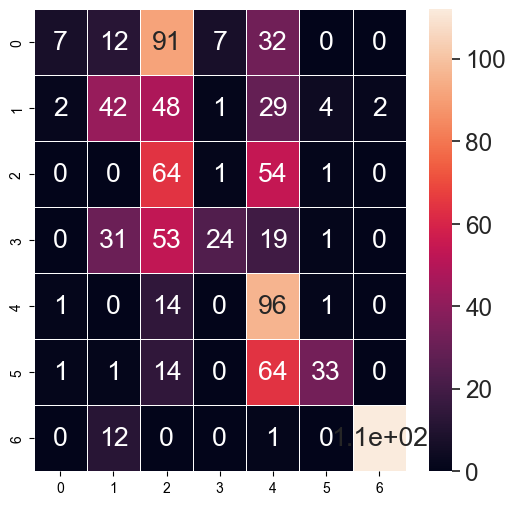

In [73]:
#Print confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

fig, ax = plt.subplots(figsize=(6,6))
sns.set(font_scale=1.6)
sns.heatmap(cm, annot=True, linewidths=.5, ax=ax)

Text(0, 0.5, 'Fraction of incorrect predictions')

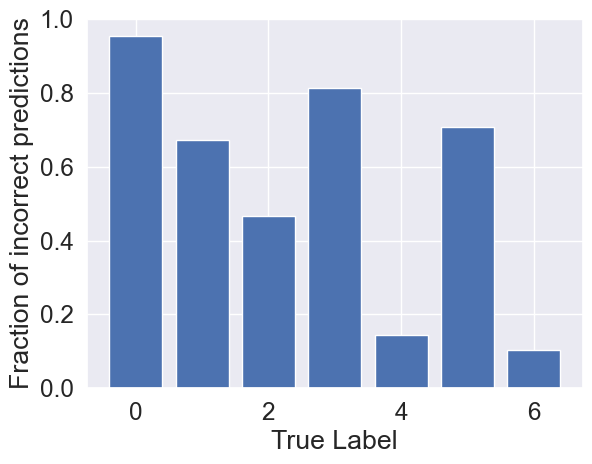

In [74]:
#PLot fractional incorrect misclassifications
incorr_fraction = 1 - np.diag(cm) / np.sum(cm, axis=1)
plt.bar(np.arange(7), incorr_fraction)
plt.xlabel('True Label')
plt.ylabel('Fraction of incorrect predictions')

METHOD 2: 
Creating Data Augmentation

Creating 2 sets of data for Model Training and Testing



Data Augmentation

In [35]:
df = df.reset_index()
index1 = df[df['label'] == 1].index.values
index2 = df[df['label'] == 2].index.values
index3 = df[df['label'] == 3].index.values
index4 = df[df['label'] == 4].index.values
index5 = df[df['label'] == 5].index.values
index6 = df[df['label'] == 6].index.values

In [36]:
df_index1 = df.iloc[int(min(index1)):int(max(index1)+1)]
df_index2 = df.iloc[int(min(index2)):int(max(index2)+1)]
df_index3 = df.iloc[int(min(index3)):int(max(index3)+1)]
df_index4 = df.iloc[int(min(index4)):int(max(index4)+1)]
df_index5 = df.iloc[int(min(index5)):int(max(index5)+1)]
df_index6 = df.iloc[int(min(index6)):int(max(index6)+1)]

In [37]:
df_index1 = df_index1.append([df_index1]*4, ignore_index = True)
df_index2 = df_index2.append([df_index2]*4, ignore_index = True)
df_index3 = df_index3.append([df_index3]*11, ignore_index = True)
df_index4 = df_index4.append([df_index4]*17, ignore_index = True)
df_index5 = df_index5.append([df_index5]*45, ignore_index = True)
df_index6 = df_index6.append([df_index6]*52, ignore_index = True)

C:\Users\abhis\AppData\Local\Temp\ipykernel_19064\2394322129.py:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_index1 = df_index1.append([df_index1]*4, ignore_index = True)
C:\Users\abhis\AppData\Local\Temp\ipykernel_19064\2394322129.py:2: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_index2 = df_index2.append([df_index2]*4, ignore_index = True)
C:\Users\abhis\AppData\Local\Temp\ipykernel_19064\2394322129.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_index3 = df_index3.append([df_index3]*11, ignore_index = True)
C:\Users\abhis\AppData\Local\Temp\ipykernel_19064\2394322129.py:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead

In [38]:
frames = [df, df_index1, df_index2, df_index3, df_index4, df_index5, df_index6]
final_data = pd.concat(frames)

In [39]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [40]:
print(df.shape)
print(final_data.shape)
fig = make_subplots(rows=2, cols=2,
                    subplot_titles=['Sex', 'Localisation', 'Age', 'Skin Type'],
                    vertical_spacing=0.15,
                    column_widths=[0.4, 0.6])

fig.add_trace(go.Bar(
            x=final_data['sex'].value_counts().index, 
            y=final_data['sex'].value_counts()),
            row=1, col=1)
fig.add_trace(go.Bar(
            x=final_data['localization'].value_counts().index, 
            y=final_data['localization'].value_counts()),
            row=1, col=2)
fig.add_trace(go.Histogram(
            x=final_data['age']),
            row=2, col=1)
fig.add_trace(go.Bar(
            x=final_data['dx'].value_counts().index.map(lesion_type_dict.get), 
            y=final_data['dx'].value_counts()),
            row=2, col=2)

for i in range(4):
    fig.update_yaxes(title_text='Count', row=i//2+1, col=i%2+1)
fig.update_layout(title='Distribution of Data after augmentation', height=800)

fig.show()

(10015, 12)
(670781, 12)


In [41]:
# Original Data: Without solving the class imbalance problem
# Converting image pixel columnm into required format
X_orig = df['image'].to_numpy()
X_orig = np.stack(X_orig, axis=0)
Y_orig = np.array(df.iloc[:, -1:])
print(X_orig.shape)
print(Y_orig.shape)

(10015, 64, 64, 3)
(10015, 1)


In [42]:
# Augmented Data: After solving the class imbalance problem
# Converting image pixel columnm into required format
X_aug = skin_df_balanced['image'].to_numpy()
X_aug = np.stack(X_aug, axis=0)
Y_aug = np.array(skin_df_balanced.iloc[:, -1:])
print(X_aug.shape)
print(Y_aug.shape)

(3500, 64, 64, 3)
(3500, 1)


Model Creation, Training, and Testing

For Original Data:


In [43]:
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
from sklearn.metrics import classification_report
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf


In [44]:
%%time
def prepare_for_train_test(X, Y):
    # Splitting into train and test set
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=1)
    
    # Prepare data for training and testing the model
    train_datagen = ImageDataGenerator(rescale = 1./255,
                                  rotation_range = 10,
                                  width_shift_range = 0.2,
                                  height_shift_range = 0.2,
                                  shear_range = 0.2,
                                  horizontal_flip = True,
                                  vertical_flip = True,
                                  fill_mode = 'nearest')
    train_datagen.fit(X_train)
    test_datagen = ImageDataGenerator(rescale = 1./255)
    test_datagen.fit(X_test)
    return X_train, X_test, Y_train, Y_test

CPU times: total: 0 ns
Wall time: 0 ns


In [51]:
def create_model():
    model = Sequential()
    model.add(Conv2D(16, kernel_size = (3,3), input_shape = (64, 64, 3), activation = 'relu', padding = 'same'))
    model.add(MaxPool2D(pool_size = (2,2)))

    model.add(Conv2D(32, kernel_size = (3,3), activation = 'relu', padding = 'same'))
    model.add(MaxPool2D(pool_size = (2,2), padding = 'same'))

    model.add(Conv2D(64, kernel_size = (3,3), activation = 'relu', padding = 'same'))
    model.add(MaxPool2D(pool_size = (2,2), padding = 'same'))
    model.add(Conv2D(128, kernel_size = (3,3), activation = 'relu', padding = 'same'))
    model.add(MaxPool2D(pool_size = (2,2), padding = 'same'))

    model.add(Flatten())
    model.add(Dense(64, activation = 'relu'))
    model.add(Dense(32, activation='relu'))
    model.add(Dense(7, activation='softmax'))

    optimizer = tf.keras.optimizers.Adam(learning_rate = 0.001)

    model.compile(loss = 'sparse_categorical_crossentropy',
                 optimizer = optimizer,
                  metrics = ['accuracy'])
    print(model.summary())
#     tf.keras.utils.plot_model(model, to_file="model.png")
    return model;

In [53]:
def train_model(model, X_train, Y_train, EPOCHS=25):
    early_stop = EarlyStopping(monitor='val_loss', patience=10, verbose=1, 
                           mode='auto', restore_best_weights=True)
    
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, 
                              verbose=1, mode='auto')
    
    history = model.fit(X_train,
                        Y_train,
                        validation_split=0.2,
                        batch_size = 64,
                        epochs = EPOCHS,
                        callbacks = [reduce_lr, early_stop])
    return history

In [54]:
def plot_model_training_curve(history):
    fig = make_subplots(rows=1, cols=2, subplot_titles=['Model Accuracy', 'Model Loss'])
    fig.add_trace(
        go.Scatter(
            y=history.history['accuracy'], 
            name='train_acc'), 
        row=1, col=1)
    fig.add_trace(
        go.Scatter(
            y=history.history['val_accuracy'], 
            name='val_acc'), 
        row=1, col=1)
    fig.add_trace(
        go.Scatter(
            y=history.history['loss'], 
            name='train_loss'), 
        row=1, col=2)
    fig.add_trace(
        go.Scatter(
            y=history.history['val_loss'], 
            name='val_loss'), 
        row=1, col=2)
    fig.show()

In [55]:
def test_model(model, X_test, Y_test):
    model_acc = model.evaluate(X_test, Y_test, verbose=0)[1]
    print("Test Accuracy: {:.3f}%".format(model_acc * 100))
    y_true = np.array(Y_test)
    y_pred = model.predict(X_test)
    y_pred = np.array(list(map(lambda x: np.argmax(x), y_pred)))
    clr = classification_report(y_true, y_pred, target_names=label_mapping.values())
    print(clr)
    
    sample_data = X_test[:15]
    plt.figure(figsize=(22, 12))
    for i in range(15):
        plt.subplot(3, 5, i + 1)
        plt.imshow(sample_data[i])
        plt.title(label_mapping[y_true[i][0]] + '|' + label_mapping[y_pred[i]])
        plt.axis("off")
    plt.show() 

In [56]:
# For Original Dataset
X_train_orig, X_test_orig, Y_train_orig, Y_test_orig = prepare_for_train_test(X_orig, Y_orig)
model1 = create_model()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 64, 64, 16)        448       
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 32, 32, 16)       0         
 2D)                                                             
                                                                 
 conv2d_6 (Conv2D)           (None, 32, 32, 32)        4640      
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 16, 16, 32)       0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 16, 16, 64)        18496     
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 8, 8, 64)        

In [57]:
model1_history = train_model(model1, X_train_orig, Y_train_orig, 50)

Epoch 1/50
101/101 [==============================] - 14s 130ms/step - loss: 1.7649 - accuracy: 0.6352 - val_loss: 1.0168 - val_accuracy: 0.6775 - lr: 0.0010
Epoch 2/50
101/101 [==============================] - 14s 138ms/step - loss: 0.8976 - accuracy: 0.6819 - val_loss: 0.8578 - val_accuracy: 0.7006 - lr: 0.0010
Epoch 3/50
101/101 [==============================] - 14s 143ms/step - loss: 0.8318 - accuracy: 0.7029 - val_loss: 0.8437 - val_accuracy: 0.6981 - lr: 0.0010
Epoch 4/50
101/101 [==============================] - 15s 146ms/step - loss: 0.8034 - accuracy: 0.7049 - val_loss: 0.8630 - val_accuracy: 0.6912 - lr: 0.0010
Epoch 5/50
101/101 [==============================] - 15s 145ms/step - loss: 0.7763 - accuracy: 0.7201 - val_loss: 0.8903 - val_accuracy: 0.6550 - lr: 0.0010
Epoch 6/50
101/101 [==============================] - 15s 147ms/step - loss: 0.7345 - accuracy: 0.7346 - val_loss: 0.7707 - val_accuracy: 0.7249 - lr: 0.0010
Epoch 7/50
101/101 [==============================] 

For Augmented Dataset:

In [58]:
X_train_aug, X_test_aug, Y_train_aug, Y_test_aug = prepare_for_train_test(X_aug, Y_aug)
model2 = create_model()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_9 (Conv2D)           (None, 64, 64, 16)        448       
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 32, 32, 16)       0         
 2D)                                                             
                                                                 
 conv2d_10 (Conv2D)          (None, 32, 32, 32)        4640      
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 16, 16, 32)       0         
 2D)                                                             
                                                                 
 conv2d_11 (Conv2D)          (None, 16, 16, 64)        18496     
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 8, 8, 64)        

In [59]:
model2_history = train_model(model2, X_train_aug, Y_train_aug, 50)

Epoch 1/50
35/35 [==============================] - 5s 130ms/step - loss: 3.6394 - accuracy: 0.1518 - val_loss: 1.9319 - val_accuracy: 0.2054 - lr: 0.0010
Epoch 2/50
35/35 [==============================] - 5s 132ms/step - loss: 1.8268 - accuracy: 0.2393 - val_loss: 1.8275 - val_accuracy: 0.2304 - lr: 0.0010
Epoch 3/50
35/35 [==============================] - 5s 138ms/step - loss: 1.6557 - accuracy: 0.3259 - val_loss: 1.5120 - val_accuracy: 0.3643 - lr: 0.0010
Epoch 4/50
35/35 [==============================] - 5s 143ms/step - loss: 1.4662 - accuracy: 0.4125 - val_loss: 1.3957 - val_accuracy: 0.4536 - lr: 0.0010
Epoch 5/50
35/35 [==============================] - 5s 143ms/step - loss: 1.3631 - accuracy: 0.4643 - val_loss: 1.2930 - val_accuracy: 0.5214 - lr: 0.0010
Epoch 6/50
35/35 [==============================] - 5s 147ms/step - loss: 1.2760 - accuracy: 0.5094 - val_loss: 1.2837 - val_accuracy: 0.4911 - lr: 0.0010
Epoch 7/50
35/35 [==============================] - 5s 151ms/step - lo

For Original Dataset:

Test Accuracy: 74.239%
63/63 [==============================] - 2s 23ms/step
              precision    recall  f1-score   support

          nv       0.26      0.31      0.28        61
         mel       0.49      0.59      0.54        96
         bkl       0.45      0.46      0.45       228
         bcc       0.00      0.00      0.00        37
       akiec       0.52      0.40      0.45       222
        vasc       0.86      0.90      0.88      1327
          df       0.82      0.56      0.67        32

    accuracy                           0.74      2003
   macro avg       0.49      0.46      0.47      2003
weighted avg       0.73      0.74      0.73      2003



c:\Users\abhis\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\abhis\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\abhis\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



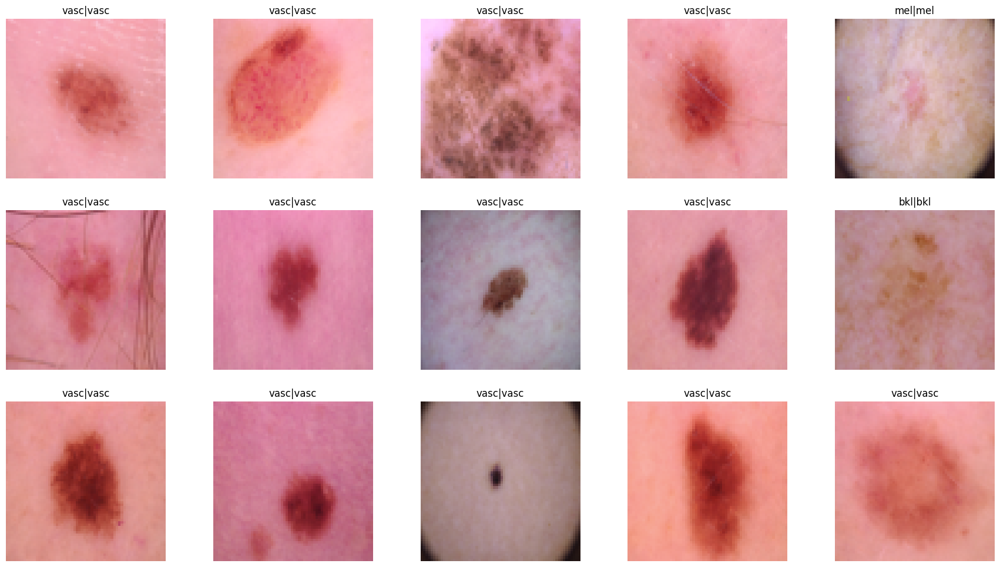

In [60]:
test_model(model1, X_test_orig, Y_test_orig)

In [61]:
plot_model_training_curve(model1_history)

For Augmented Dataset:


Test Accuracy: 74.429%
22/22 [==============================] - 1s 21ms/step
              precision    recall  f1-score   support

          nv       0.71      0.71      0.71       102
         mel       0.77      0.67      0.71        99
         bkl       0.58      0.62      0.60       107
         bcc       0.82      0.96      0.88       103
       akiec       0.74      0.63      0.68       101
        vasc       0.63      0.68      0.66        87
          df       0.97      0.94      0.95       101

    accuracy                           0.74       700
   macro avg       0.75      0.74      0.74       700
weighted avg       0.75      0.74      0.74       700



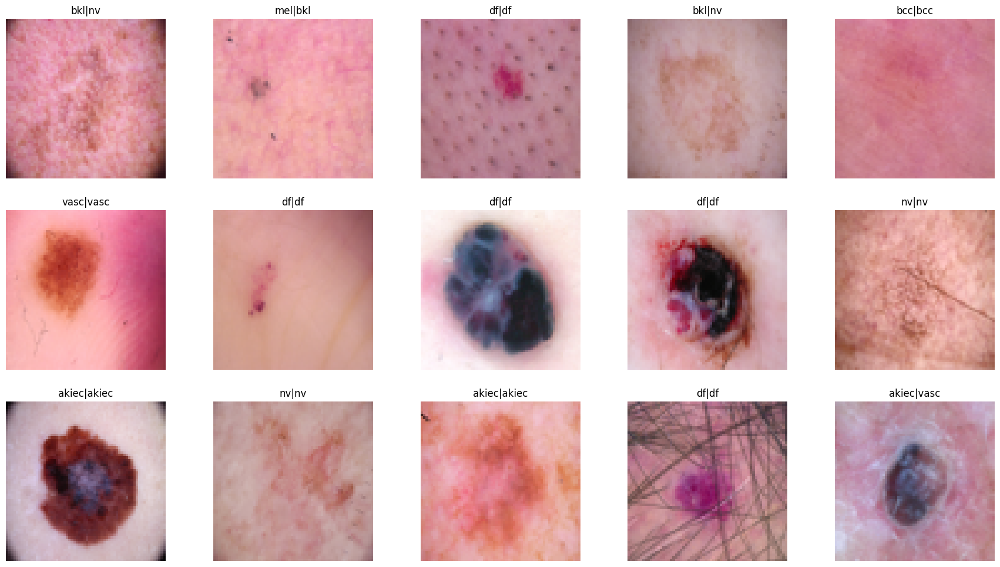

In [62]:
test_model(model2, X_test_aug, Y_test_aug)

In [80]:
plot_model_training_curve(model2_history)

Method 3: Implementing Cross Validation to the Model to avoid overfitting

In [97]:
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import cross_val_score
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Dense, Flatten, Conv2D
from keras.layers import  MaxPooling2D, Dropout


In [101]:
def create_model():
    # create model
    model = Sequential()
    model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(64, 64, 3)))  # Input layer
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Conv2D(128, (3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))

    model.add(Flatten())  # Flatten the output of the previous layer
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(7, activation='sigmoid'))  # Output layer

    # Compile model
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model

In [102]:
# Create a classifier with best parameters
model = KerasClassifier(build_fn=create_model, epochs=20, batch_size=10, verbose=0)


C:\Users\abhis\AppData\Local\Temp\ipykernel_19064\3690727118.py:2: DeprecationWarning:

KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.



In [105]:
# Assuming 'model' is your Keras model
history = model.fit(X, Y_cat, epochs=25, batch_size=32, verbose=1)

Epoch 1/25
110/110 [==============================] - 12s 104ms/step - loss: 0.4405 - accuracy: 0.1531
Epoch 2/25
110/110 [==============================] - 12s 109ms/step - loss: 0.4026 - accuracy: 0.2306
Epoch 3/25
110/110 [==============================] - 13s 118ms/step - loss: 0.3781 - accuracy: 0.3123
Epoch 4/25
110/110 [==============================] - 13s 116ms/step - loss: 0.3434 - accuracy: 0.3811
Epoch 5/25
110/110 [==============================] - 13s 118ms/step - loss: 0.3276 - accuracy: 0.4257
Epoch 6/25
110/110 [==============================] - 13s 117ms/step - loss: 0.3106 - accuracy: 0.4549
Epoch 7/25
110/110 [==============================] - 13s 118ms/step - loss: 0.3020 - accuracy: 0.4806
Epoch 8/25
110/110 [==============================] - 13s 118ms/step - loss: 0.2977 - accuracy: 0.5009
Epoch 9/25
110/110 [==============================] - 13s 117ms/step - loss: 0.2866 - accuracy: 0.5123
Epoch 10/25
110/110 [==============================] - 13s 117ms/step - l

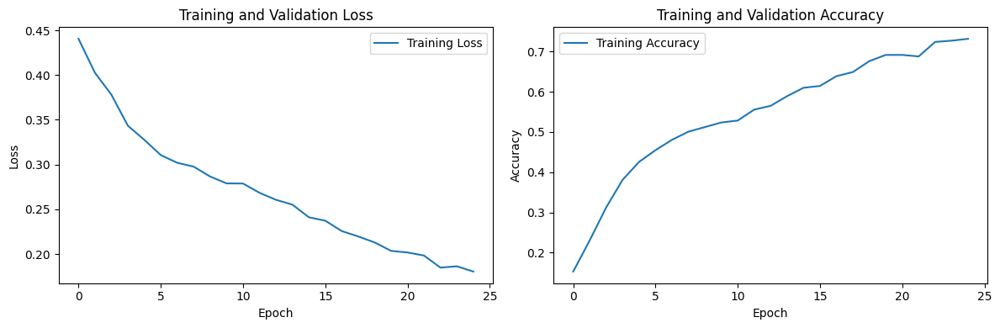

In [107]:
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()